In [5]:
import sys
import os
sys.path.append(os.path.abspath('../..'))


# from scan_engine.status_fields_config_24summ import STATUS_FIELDS_CONFIG
from status_fields_config_oct3v1_brws_250220 import STATUS_FIELDS_CONFIG

from utlis.scan_engine_utlis.scan_eng_big_utlis import log_folder_to_parquet_sep

if __name__ == "__main__":
    base_folder = "/data/big_rim/rsync_dcc_sum/Oct3V1" #"/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ"  # Replace with your base folder
    # save_path = os.path.join(base_folder, 'paret')
    failed_paths_file = '/data/big_rim/rsync_dcc_sum/Oct3V1/sync_failed_brws.txt'  # File containing failed paths


    force_rescan_rec_files = [
        # ('2023-10-01', '001'),
        # ('2023-10-02', '002'),
        # Add more as needed
    ]
    rescan_threshold_days = 0.001 # 7 days, but guess if i mess up i can just change it to automatically rescan all, smile... #0.1

    log_folder_to_parquet_sep(base_folder, failed_paths_file, STATUS_FIELDS_CONFIG,
                              force_rescan_rec_files=force_rescan_rec_files,
                              rescan_threshold_days=rescan_threshold_days)


Log for 20241224PMCLE1_14_12 saved at /data/big_rim/rsync_dcc_sum/Oct3V1/2025_03_11/20241224PMCLE1_14_12/folder_log.parquet
Log for 20241224PMCLE1mini_p20240303PMC1_14_21 saved at /data/big_rim/rsync_dcc_sum/Oct3V1/2025_03_11/20241224PMCLE1mini_p20240303PMC1_14_21/folder_log.parquet
Log for 20241224PMCLE1mini_p20240303PMC2_14_44 saved at /data/big_rim/rsync_dcc_sum/Oct3V1/2025_03_11/20241224PMCLE1mini_p20240303PMC2_14_44/folder_log.parquet
Log for 20241015pmcr1_AO_14_52 saved at /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_07/20241015pmcr1_AO_14_52/folder_log.parquet
Log for 20241015pmcr2_AO_12_52 saved at /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_07/20241015pmcr2_AO_12_52/folder_log.parquet
Log for 2social_mini_20241015pmcr2_single_AO_13_24 saved at /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_07/2social_mini_20241015pmcr2_single_AO_13_24/folder_log.parquet
Log for 20240819V1r2 saved at /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_03/20240819V1r2/folder_log.parquet
Log for 2social_mini_060

In [6]:
# sys.path.append(os.path.abspath('../..'))
from utlis.scan_engine_utlis.scan_engine_utlis import read_all_parquet_files
base_folder = "/data/big_rim/rsync_dcc_sum/Oct3V1" 
all_df = read_all_parquet_files(base_folder)

In [7]:
import pyarrow.compute as pc
from functools import reduce
table = all_df #combined_df

# quality_mask = pc.or_(
#     pc.equal(table['quality'], 'good'),
#     pc.equal(table['quality'], 'good_vein')
# )
conditions = [
   pc.equal(table['mini_rec_sync'], '1')
#    pc.equal(table['quality'], 'good'),
#    pc.equal(table['quality'], 'good_vein')
# quality_mask
]

filter_mask = reduce(pc.and_, conditions)
# Apply the filter and print the results
post_ana = table.filter(filter_mask)

# Print each row of the filtered table
print(post_ana.to_pandas())  # This will display the filtered data in a familiar pandas-like format


   mir_generate_param sync dropf_handle com social miniscope test  \
0                   1    1            0   1      0         1    0   
1                   1    1            0   1      0         1    0   
2                   1    1            0   1      0         1    0   
3                   1    1            0   1      0         1    0   
4                   1    1            0   1      0         1    0   
5                   1    1            0   1      0         1    0   
6                   1    1            0   1      0         1    0   
7                   1    1            0   1      0         1    0   
8                   1    1            0   1      0         1    0   
9                   1    1            0   1      0         1    0   
10                  1    1            0   1      1         1    0   
11                  1    1            0   1      0         1    0   
12                  1    1            0   1      0         1    0   
13                  1    1        

In [8]:
df = post_ana.to_pandas()
df['path'] = df.apply(lambda row: os.path.join(base_folder, row['date_folder'], row['rec_file']), axis=1)


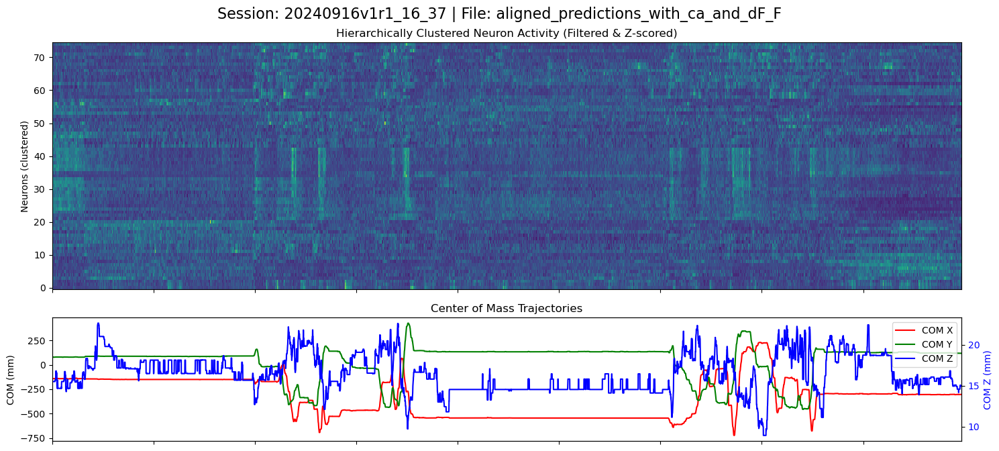

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_14/20240916v1r1_16_37


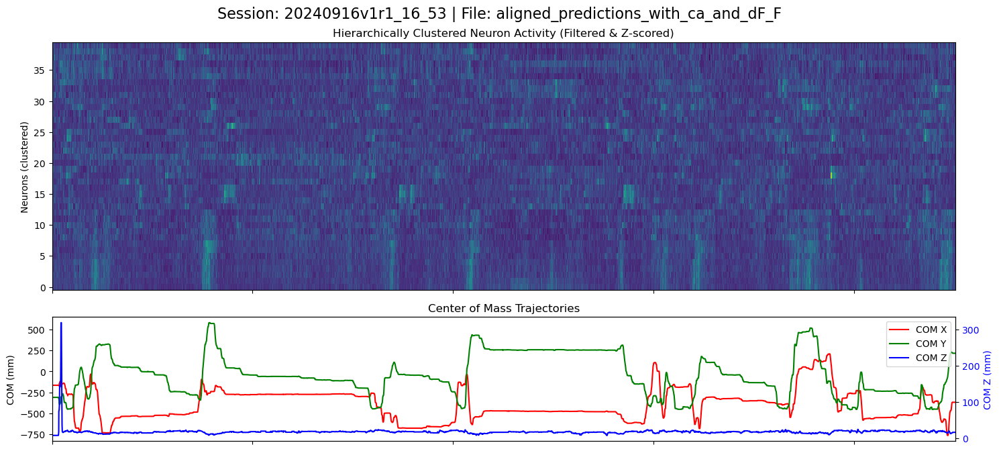

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_14/20240916v1r1_16_53


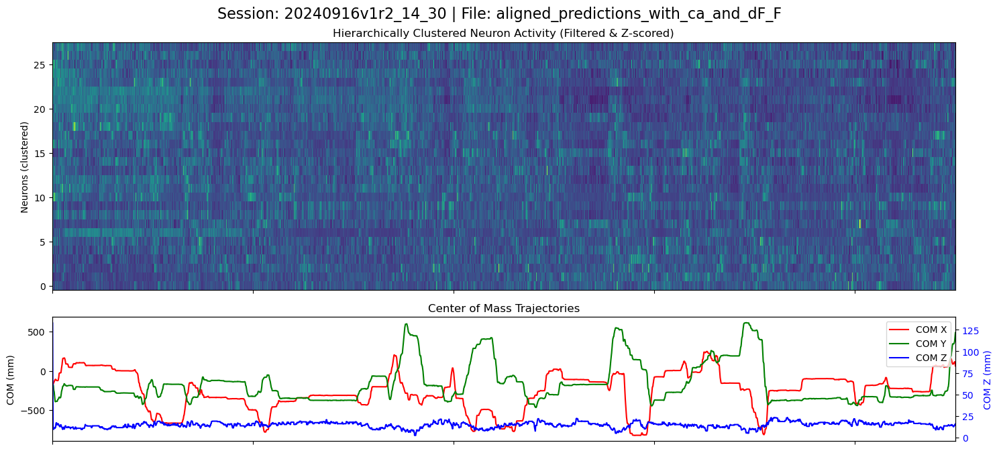

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_14/20240916v1r2_14_30


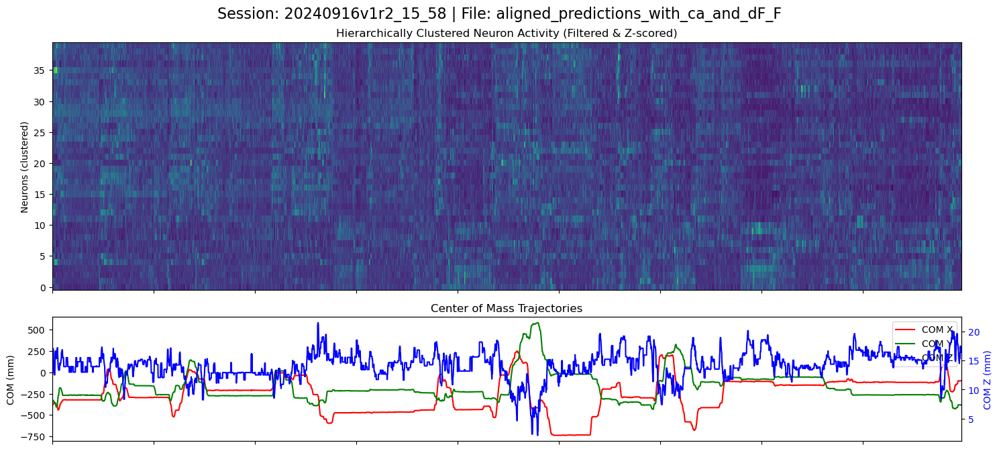

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_14/20240916v1r2_15_58


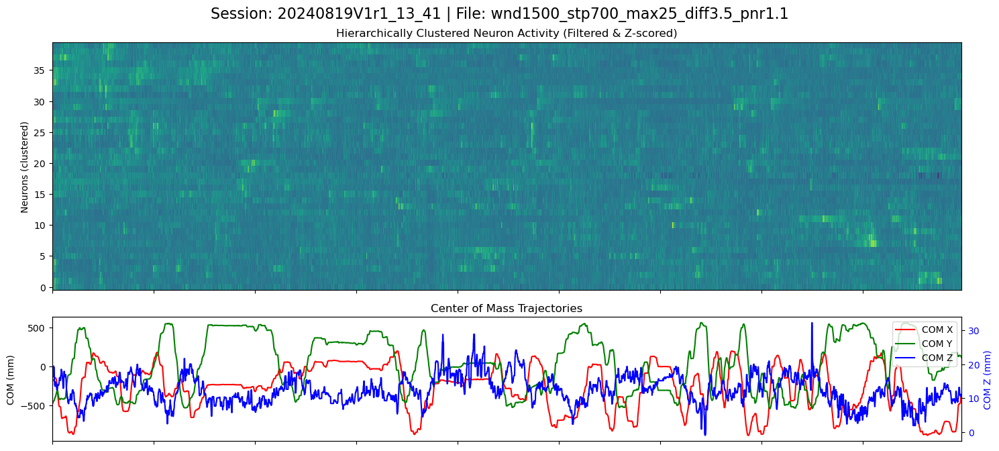

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_17/20240819V1r1_13_41


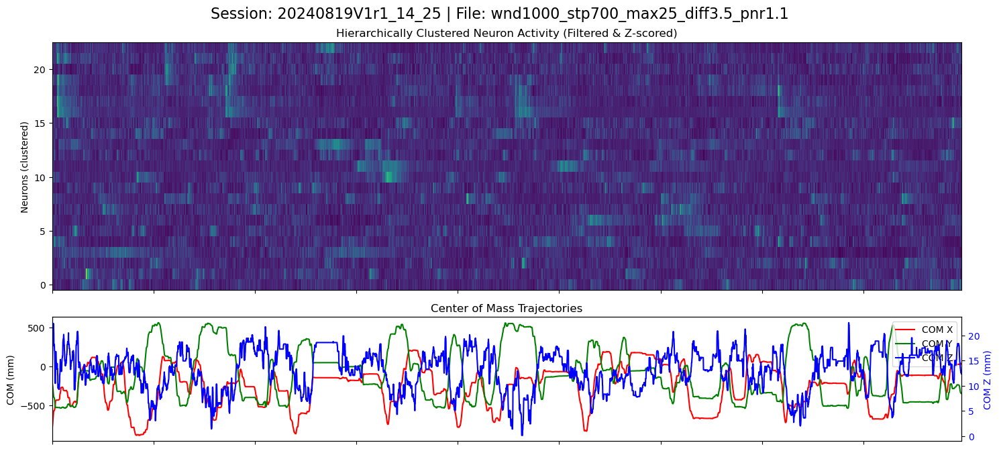

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_17/20240819V1r1_14_25


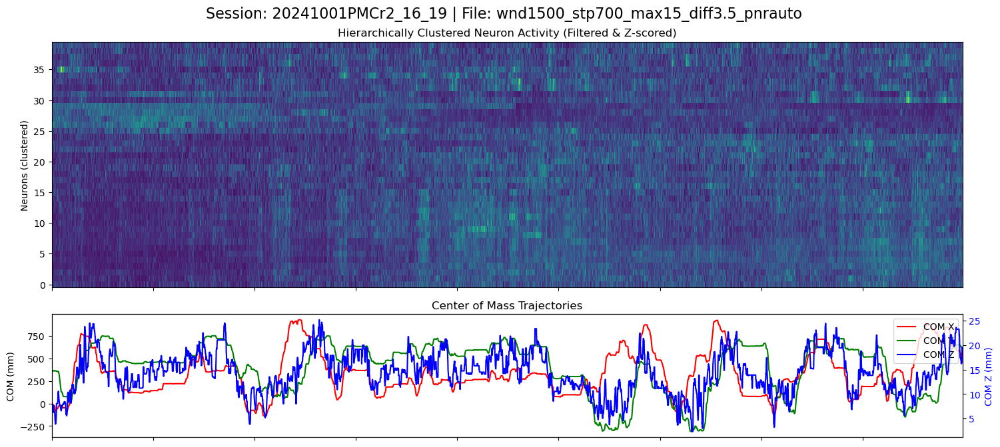

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_24/20241001PMCr2_16_19


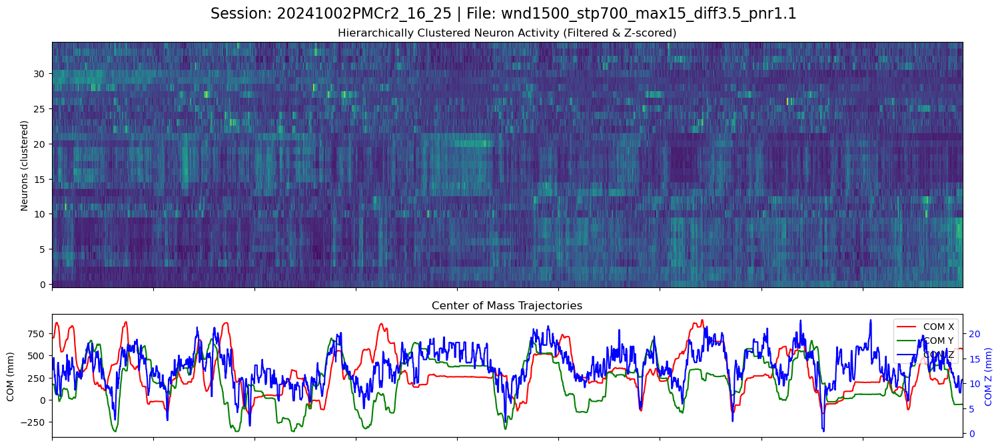

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_25/20241002PMCr2_16_25


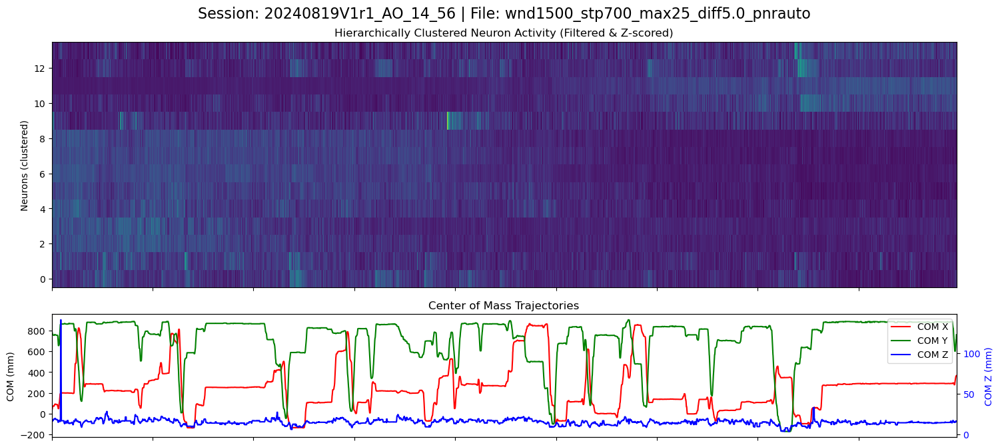

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/20240819V1r1_AO_14_56


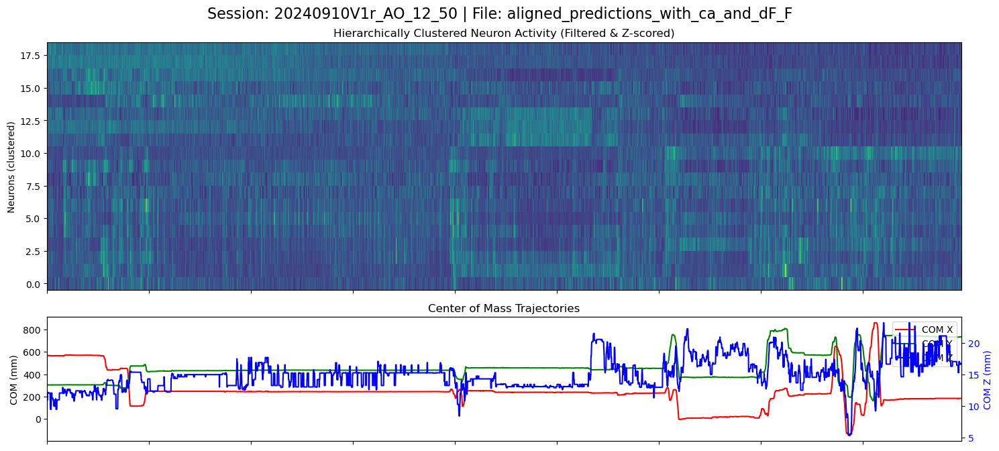

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/20240910V1r_AO_12_50


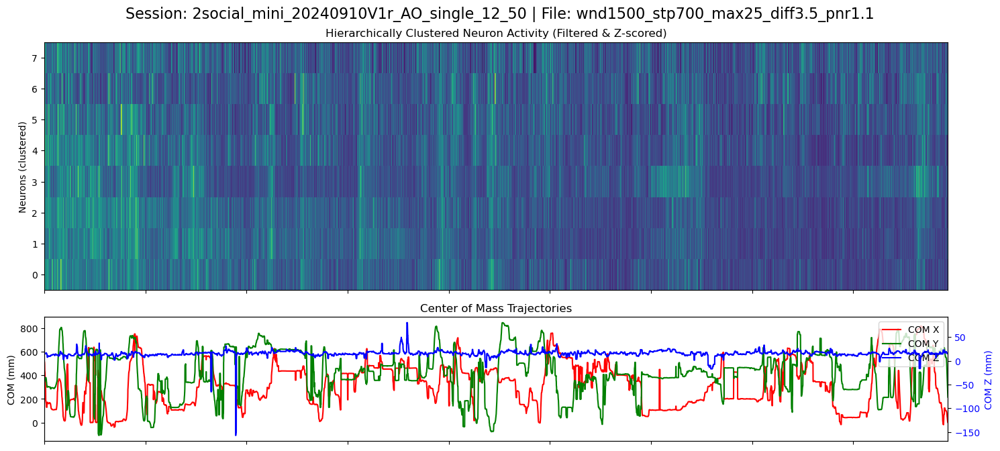

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/2social_mini_20240910V1r_AO_single_12_50


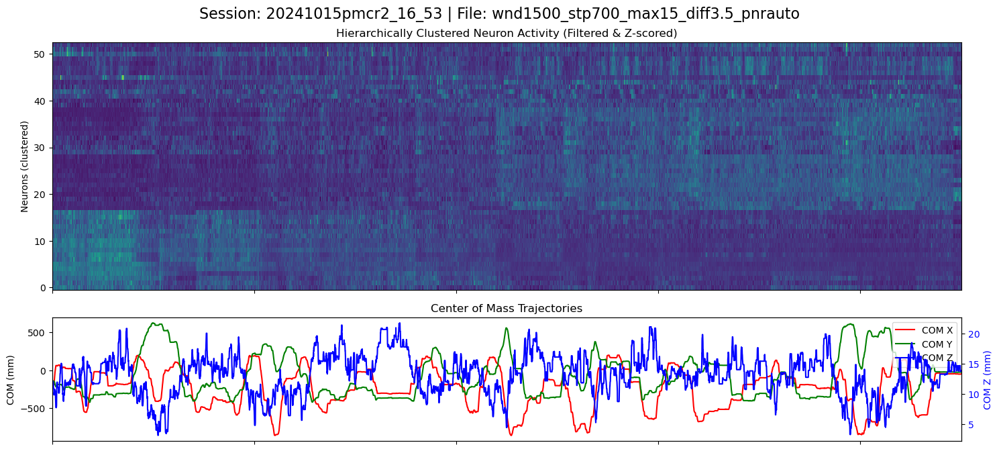

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_06/20241015pmcr2_16_53


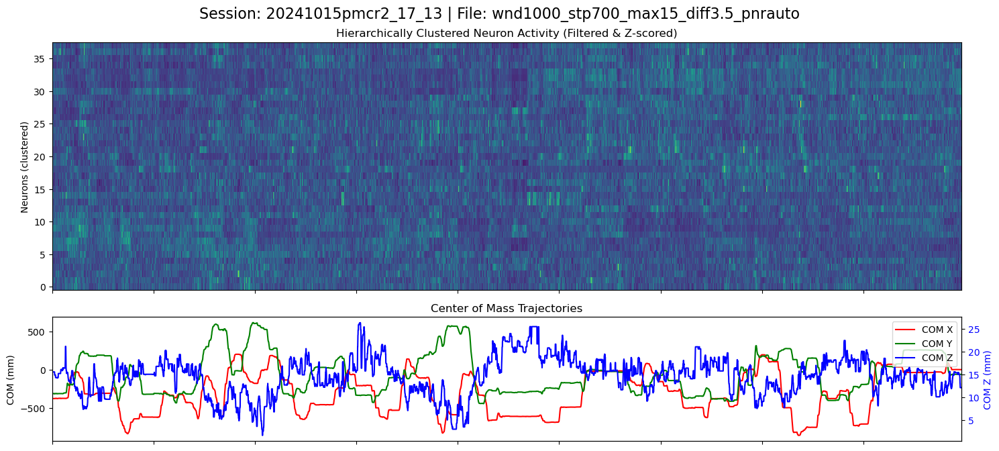

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_06/20241015pmcr2_17_13


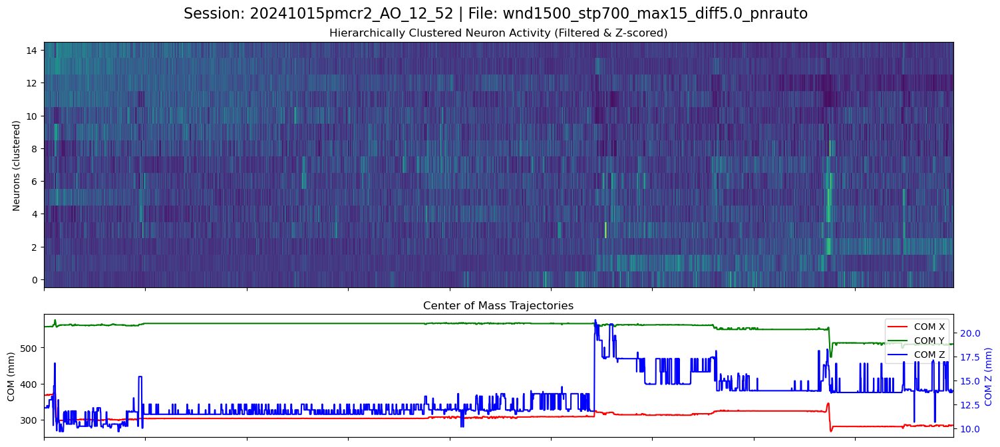

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_07/20241015pmcr2_AO_12_52


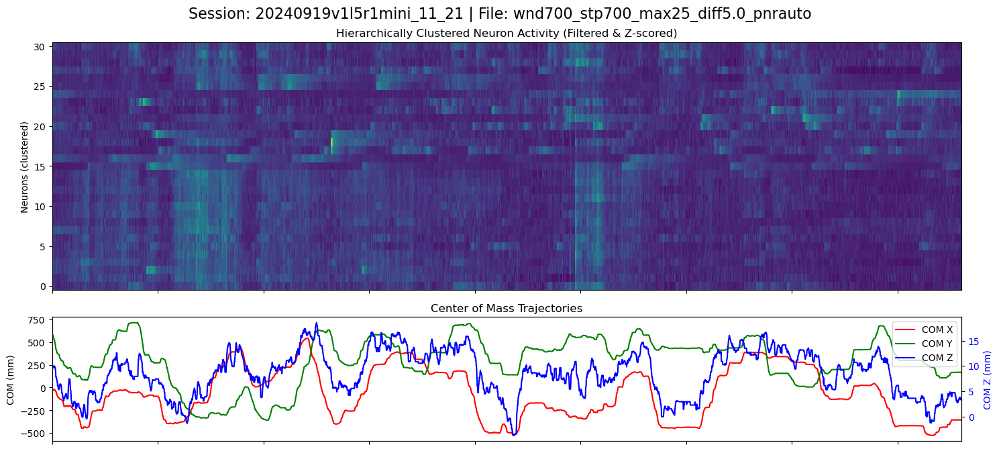

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2024_12_18/20240919v1l5r1mini_11_21


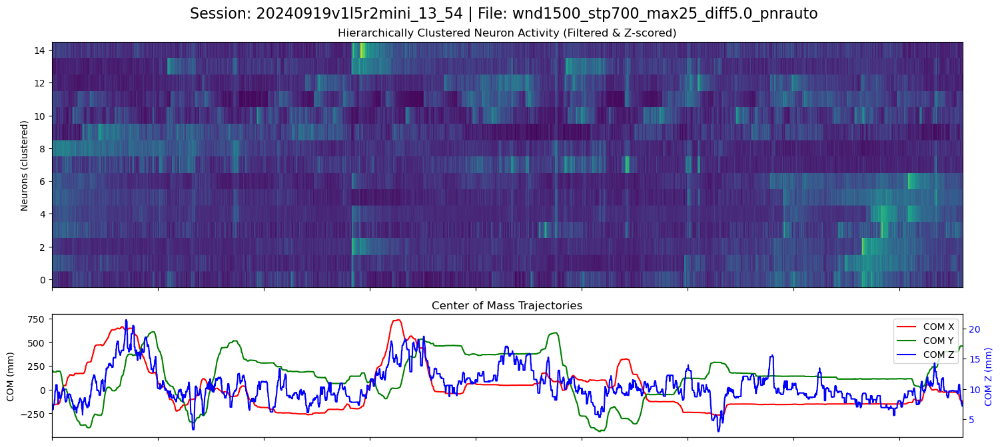

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2024_12_31/20240919v1l5r2mini_13_54


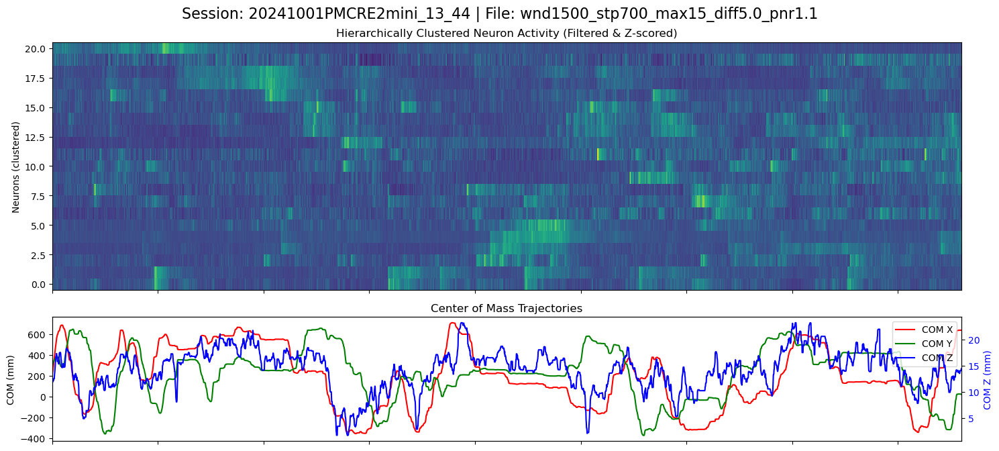

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_12/20241001PMCRE2mini_13_44


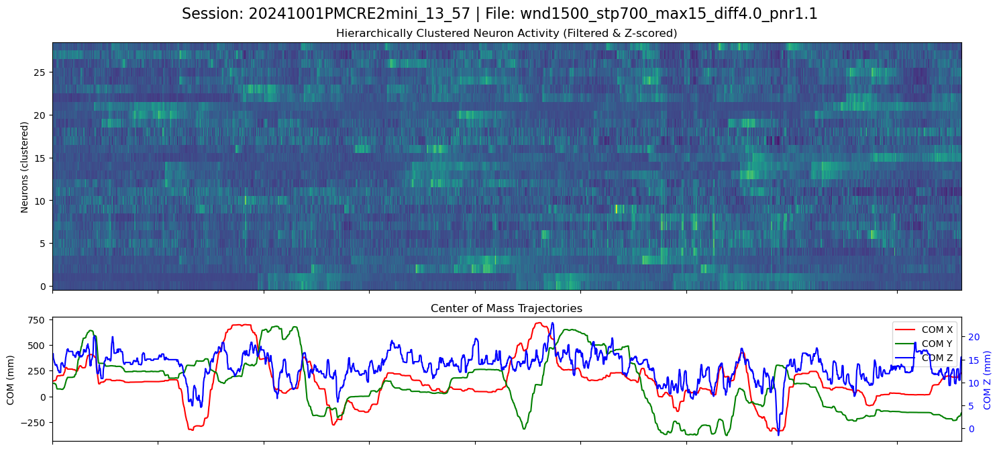

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_12/20241001PMCRE2mini_13_57


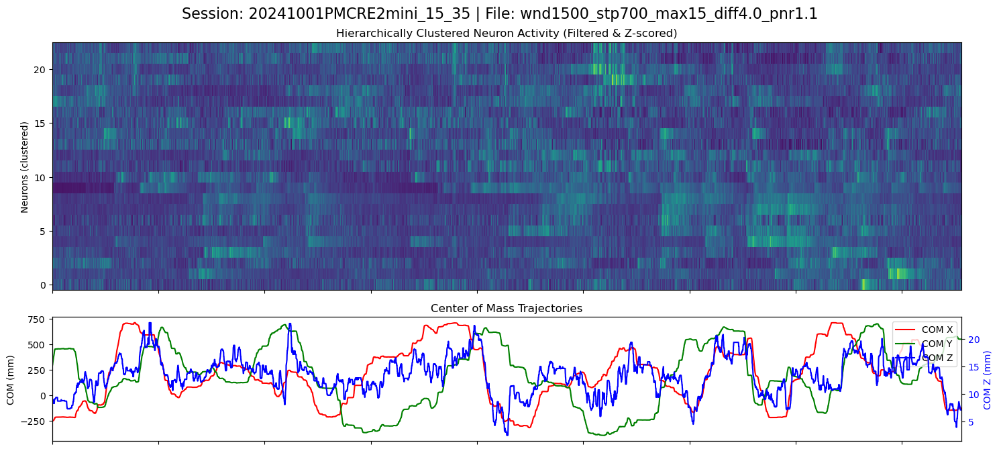

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_12/20241001PMCRE2mini_15_35


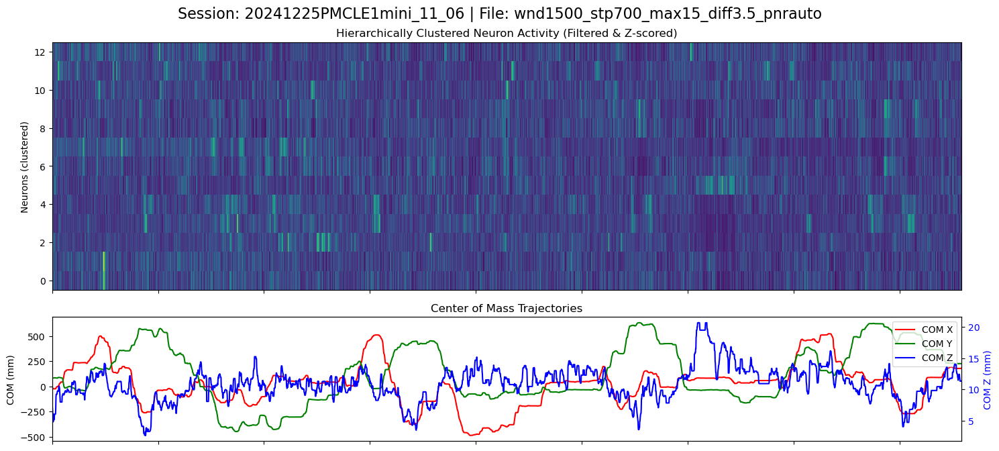

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_13/20241225PMCLE1mini_11_06


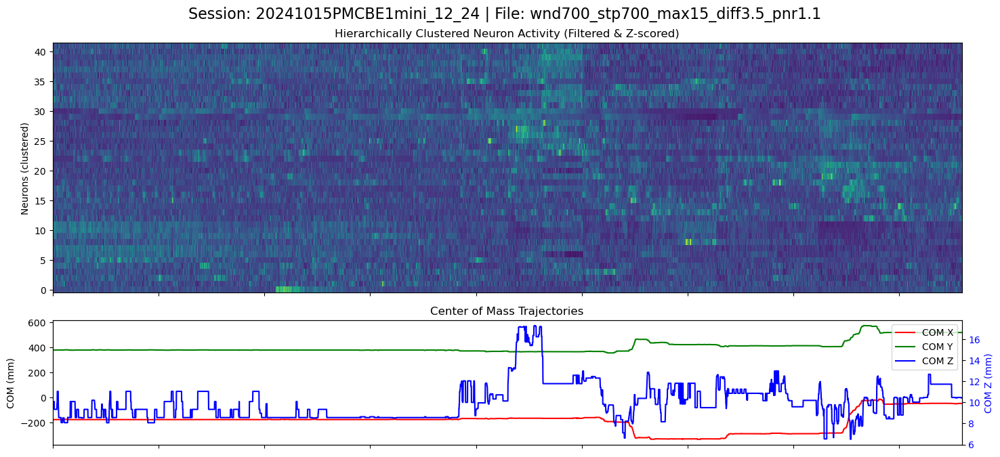

Finished processing /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_27/20241015PMCBE1mini_12_24


In [5]:
# import matplotlib
# # Use a non-interactive backend for matplotlib to avoid issues in parallel contexts
# # matplotlib.use('Agg')
# import matplotlib.pyplot as plt
# from concurrent.futures import ThreadPoolExecutor, as_completed
# from utlis.corr_utlis.corr_vis_utlis import run_session_plot

# # Assume process_path is defined as follows:
# def process_path(session_path, exclude_dict=None):
#     try:
#         run_session_plot(session_path, exclude_dict)
#         plt.close('all')
#         return f"Finished processing {session_path}"
#     except Exception as e:
#         return f"Error processing {session_path}: {e}"

# # Function to run sessions in parallel using threads
# def run_parallel_sessions(session_paths, exclude_dict=None):
#     results = []
#     with ThreadPoolExecutor() as executor:
#         # Submit all processing tasks
#         futures = [executor.submit(process_path, path, exclude_dict) for path in session_paths]
#         for future in as_completed(futures):
#             results.append(future.result())
#     return results

# # Example usage in a Jupyter cell:
# # Assume df is your DataFrame containing the 'path' column
# session_paths = df['path'].tolist()  # Replace `df` with your variable if named differently

# # Optionally, set exclude_dict to your exclusion dictionary (or None if no exclusions)
# exclude_dict = None  # Or load/provide your dictionary

# # Run the parallel processing
# results = run_parallel_sessions(session_paths, exclude_dict)
# print("\n".join(results))
from utlis.corr_utlis.corr_vis_utlis import run_session_plot
import matplotlib.pyplot as plt

def process_path(session_path, exclude_dict=None):
    try:
        run_session_plot(session_path, exclude_dict)
        plt.close('all')
        print(f"Finished processing {session_path}")
    except Exception as e:
        print(f"Error processing {session_path}: {e}")

# Replace df with your actual DataFrame if named differently
session_paths = df['path'].tolist()
exclude_dict = None  # or your actual dictionary

for path in session_paths:
    process_path(path, exclude_dict)


In [ ]:
import os
import sys
sys.path.append(os.path.abspath('../..'))
from utlis.Ca_tools.mini_param_vis_utlis import vis_param_all_with_mapping
import json

# here, is for overlay mappings.

csv_path = "/home/lq53/mir_repos/BBOP/random_tests/25mar_minibbop_integration/mini_nc_mapping_250327.csv"
mapping_json = "/home/lq53/mir_repos/BBOP/random_tests/25mar_minibbop_integration/mini_to_rec_mapping.json"
vis_param_all_with_mapping(csv_path, mapping_json, threshold=10, display_only=False)



Processing row 0: session_dir = /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/202401015-PMC-r2/customEntValHere/2024_11_07/13_04_45/My_V4_Miniscope, selection = wnd1500_stp700_max15_diff5.0_pnrauto
Found 1 matching .nc file(s) for session: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/202401015-PMC-r2/customEntValHere/2024_11_07/13_04_45/My_V4_Miniscope
Removed old overlay file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/202401015-PMC-r2/customEntValHere/2024_11_07/13_04_45/My_V4_Miniscope/overlay_wnd1500_stp700_max15_diff5.0_pnrauto.png
Processing file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/202401015-PMC-r2/customEntValHere/2024_11_07/13_04_45/My_V4_Miniscope/minian_dataset_wnd1500_stp700_max15_diff5.0_pnrauto.nc
Saved overlay locally to: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/202401015-PMC-r2/customEntValHere/2024_11_07/13_04_45/My_V4_Miniscope/overlay_wnd1500_stp700_max15_diff5.0_pnrauto.png
Saved overlay into mapped directory: /data/big_rim/rsync_dcc_sum/Oct3V1/2


Processing session from DataFrame index 0: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_14/20240916v1r1_16_37
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_14/20240916v1r1_16_37/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20240916-V1-R1/customEntValHere/2024_10_14/16_38_19/My_V4_Miniscope/minian_dataset.nc


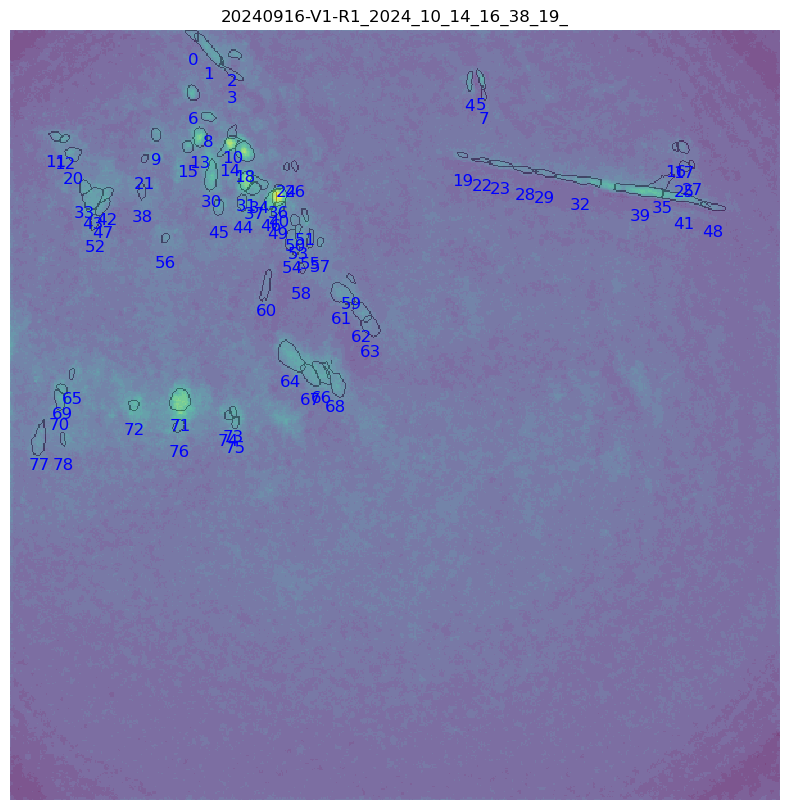


Processing session from DataFrame index 1: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_14/20240916v1r1_16_53
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_14/20240916v1r1_16_53/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20240916-V1-R1/customEntValHere/2024_10_14/16_54_16/My_V4_Miniscope/minian_dataset.nc


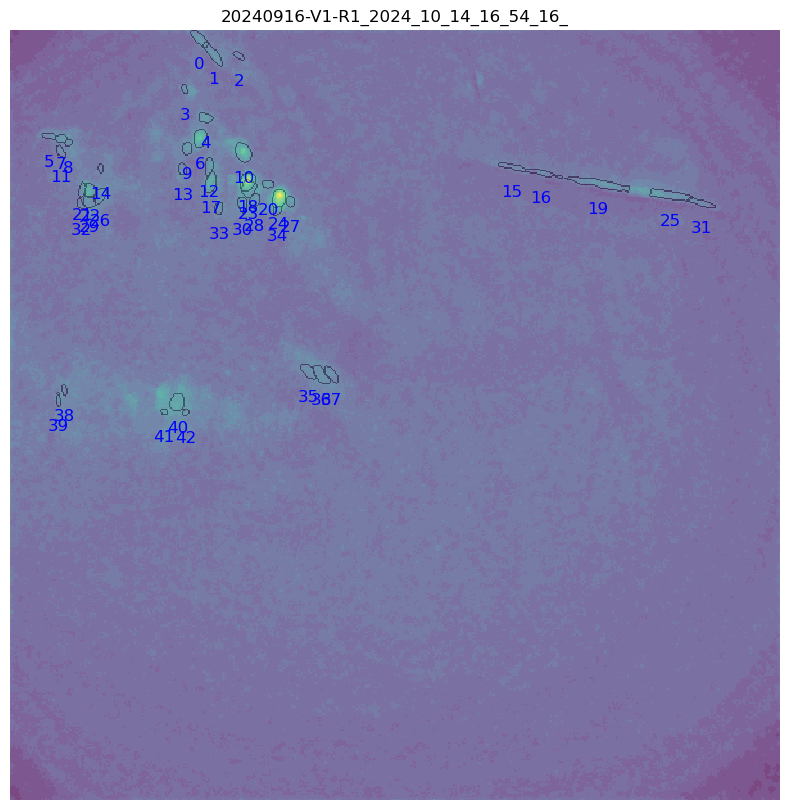


Processing session from DataFrame index 2: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_14/20240916v1r2_14_30
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_14/20240916v1r2_14_30/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20240916-V1-R2/customEntValHere/2024_10_14/14_23_28/My_V4_Miniscope/minian_dataset.nc


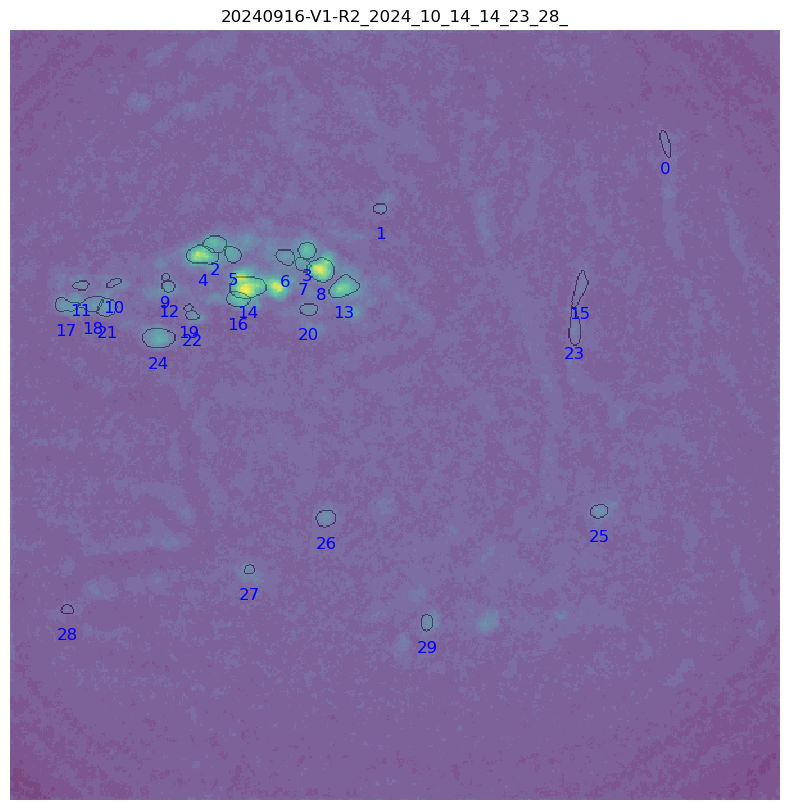


Processing session from DataFrame index 3: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_14/20240916v1r2_15_58
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_14/20240916v1r2_15_58/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20240916-V1-R2/customEntValHere/2024_10_14/16_03_58/My_V4_Miniscope/minian_dataset.nc


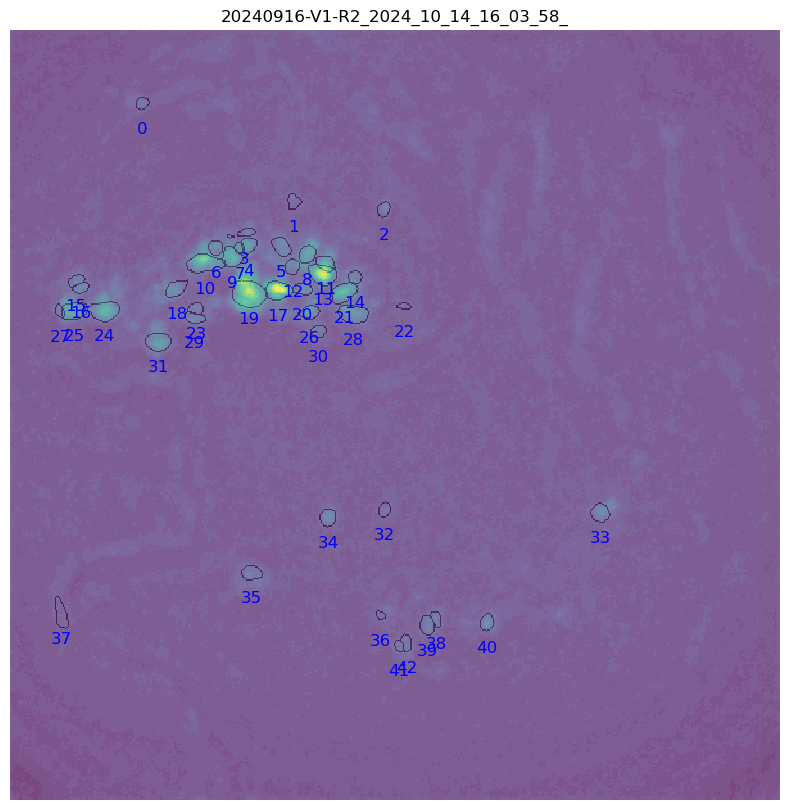


Processing session from DataFrame index 4: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_17/20240819V1r1_13_41
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_17/20240819V1r1_13_41/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20240819-V1-r1/customEntValHere/2024_10_17/14_09_19/My_V4_Miniscope/minian_dataset.nc


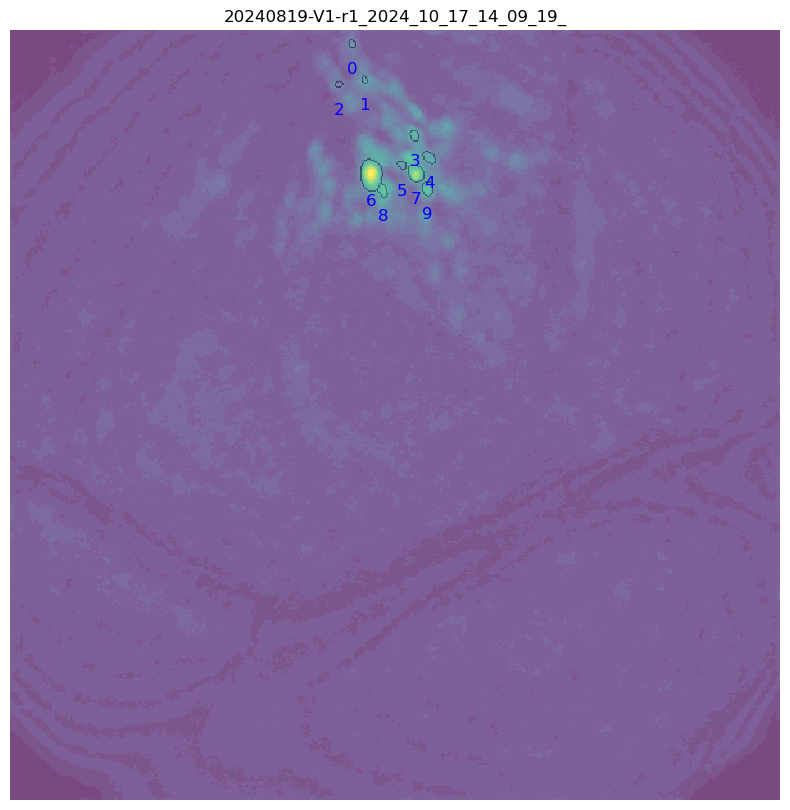


Processing session from DataFrame index 5: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_17/20240819V1r1_14_25
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_17/20240819V1r1_14_25/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20240819-V1-r1/customEntValHere/2024_10_17/14_25_32/My_V4_Miniscope/minian_dataset_wnd1000_stp700_max25_diff3.5_pnr1.1.nc


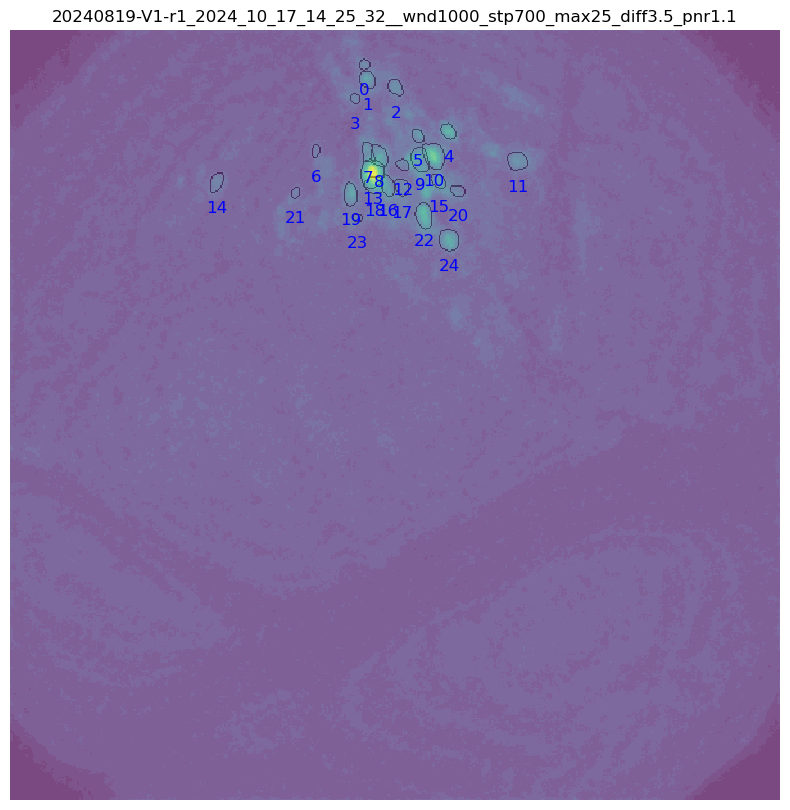


Processing session from DataFrame index 6: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_24/20241001PMCr2_16_19
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_24/20241001PMCr2_16_19/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20241001-PMC-r2/customEntValHere/2024_10_24/16_20_26/My_V4_Miniscope/minian_dataset.nc


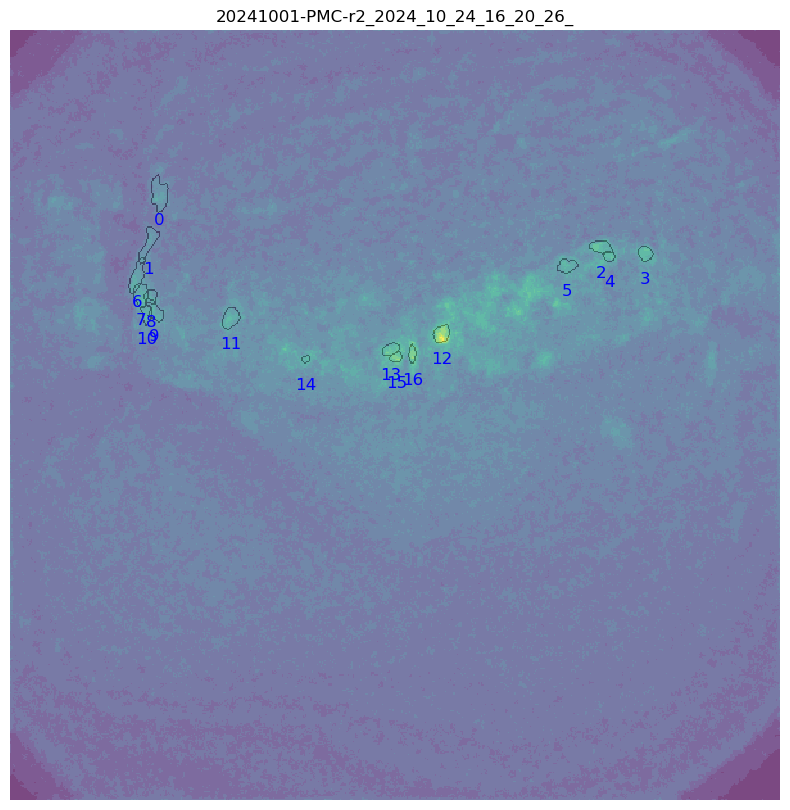


Processing session from DataFrame index 7: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_25/20241002PMCr2_16_25
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_25/20241002PMCr2_16_25/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20241002-pmc-r2/customEntValHere/2024_10_25/16_27_28/My_V4_Miniscope/minian_dataset.nc


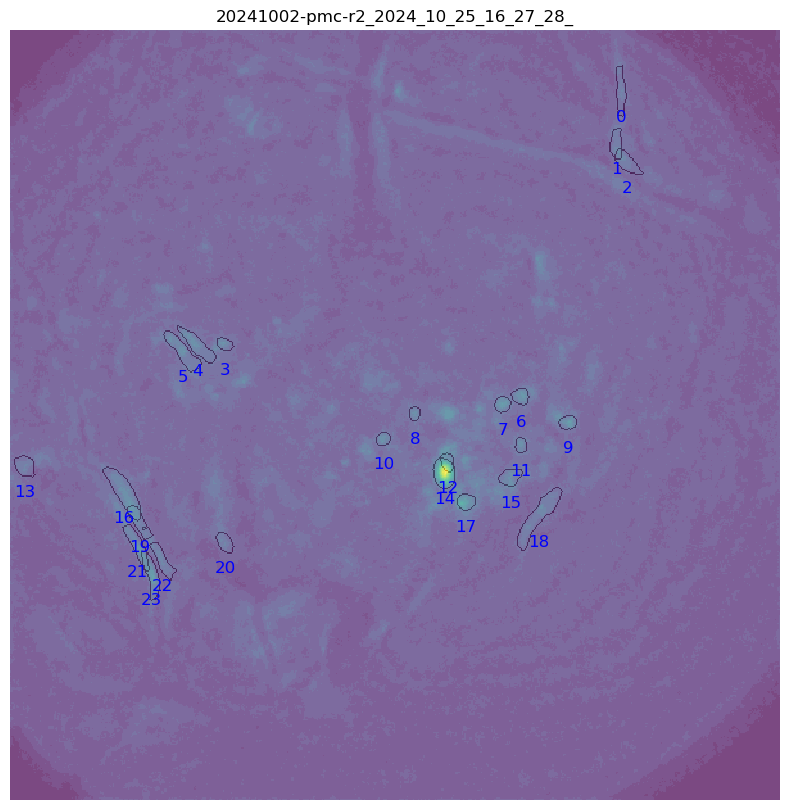


Processing session from DataFrame index 8: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/20240819V1r1_AO_14_56
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/20240819V1r1_AO_14_56/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20240819-V1-r1/customEntValHere/2024_11_01/14_57_45/My_V4_Miniscope/minian_dataset.nc


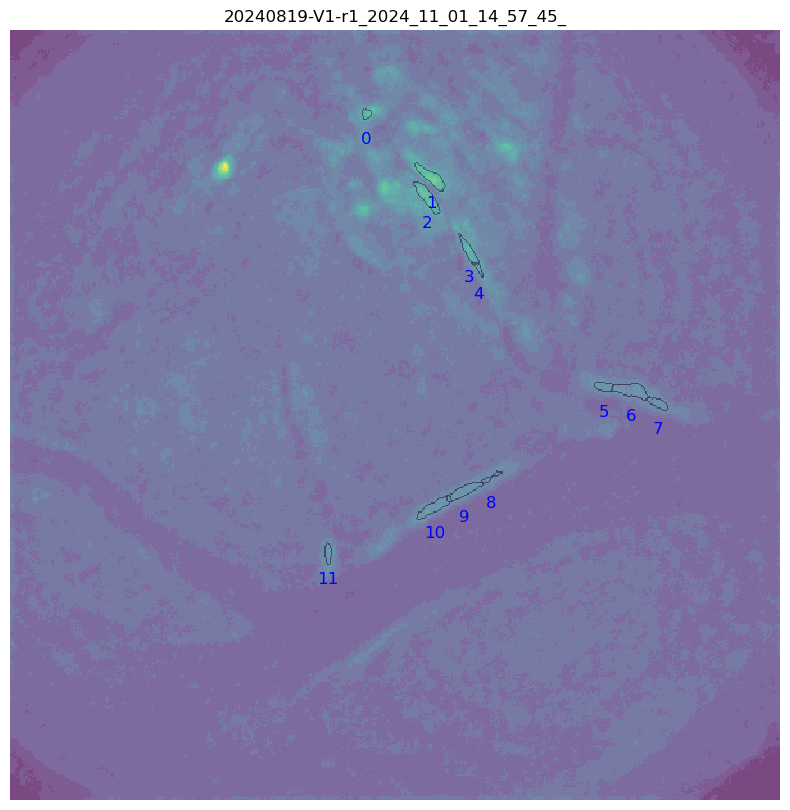


Processing session from DataFrame index 9: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/20240910V1r_AO_12_50
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/20240910V1r_AO_12_50/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20240910-V1-R/customEntValHere/2024_11_01/12_52_48/My_V4_Miniscope/minian_dataset.nc


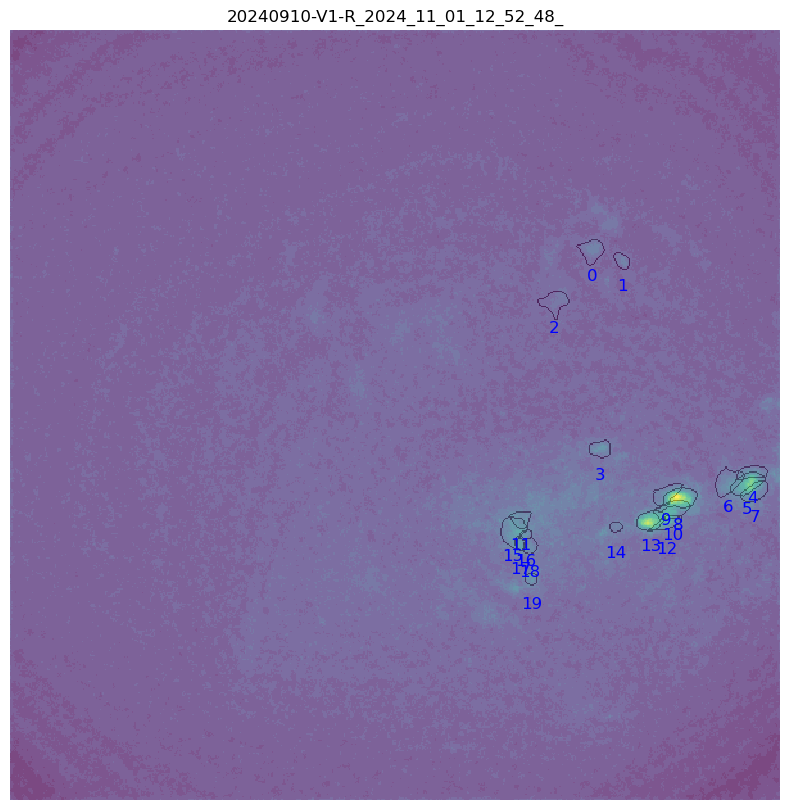


Processing session from DataFrame index 10: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/2social_mini_20240910V1r_AO_single_12_50
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/2social_mini_20240910V1r_AO_single_12_50/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20240910-V1-R/customEntValHere/2024_11_01/13_09_59/My_V4_Miniscope/minian_dataset.nc


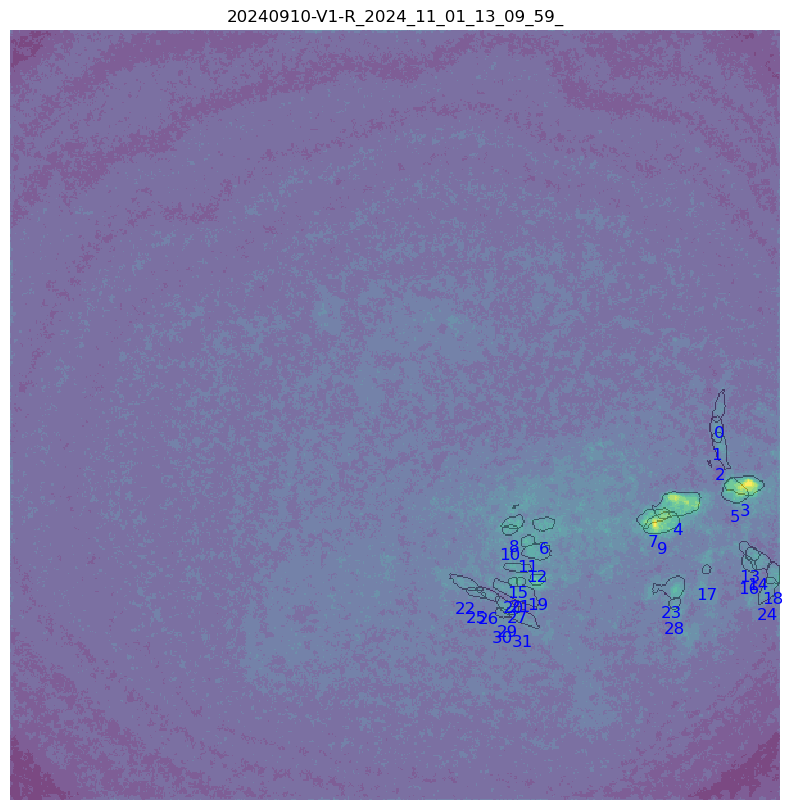


Processing session from DataFrame index 11: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_06/20241015pmcr2_16_53
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_06/20241015pmcr2_16_53/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/202401015-PMC-r2/customEntValHere/2024_11_06/16_57_35/My_V4_Miniscope/minian_dataset_241104_denoised.nc


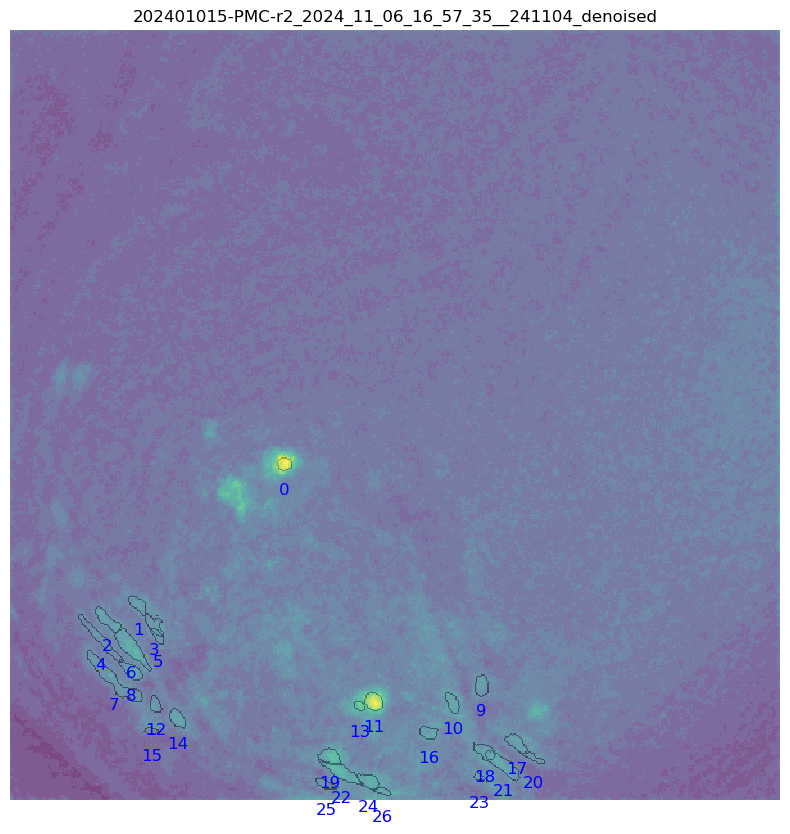


Processing session from DataFrame index 12: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_06/20241015pmcr2_17_13
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_06/20241015pmcr2_17_13/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/202401015-PMC-r2/customEntValHere/2024_11_06/17_13_26/My_V4_Miniscope/minian_dataset_wnd1000_stp700_max15_diff3.5_pnrauto.nc


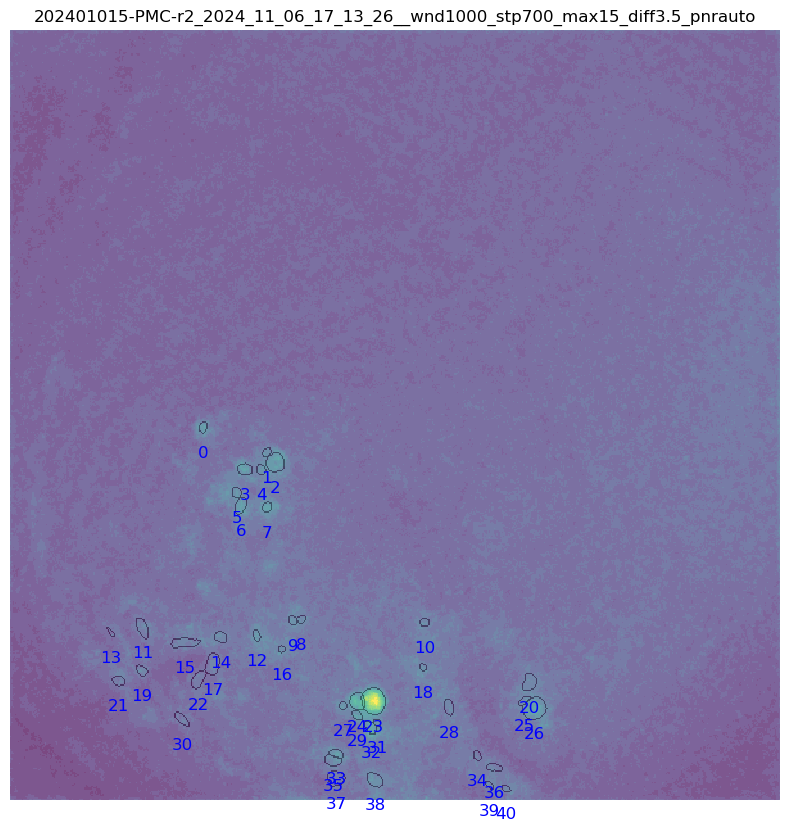


Processing session from DataFrame index 13: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_07/20241015pmcr2_AO_12_52
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_07/20241015pmcr2_AO_12_52/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/202401015-PMC-r2/customEntValHere/2024_11_07/13_04_45/My_V4_Miniscope/minian_dataset.nc


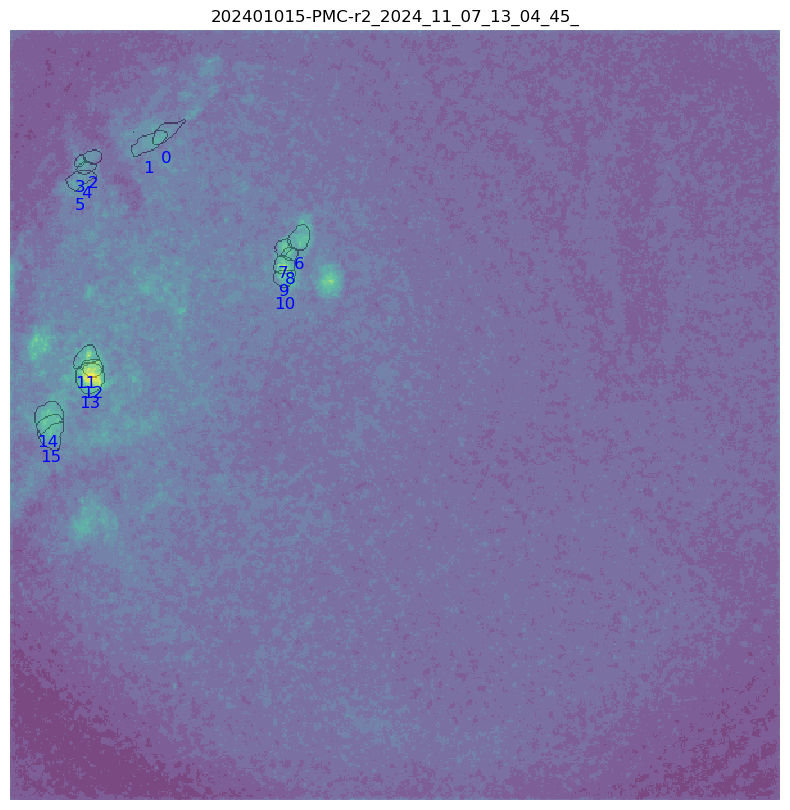


Processing session from DataFrame index 14: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_12_18/20240919v1l5r1mini_11_21
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_12_18/20240919v1l5r1mini_11_21/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20240919-V1-R1/customEntValHere/2024_12_18/11_22_07/My_V4_Miniscope/minian_dataset_wnd1000_stp700_max25_diff3.5_pnrauto.nc


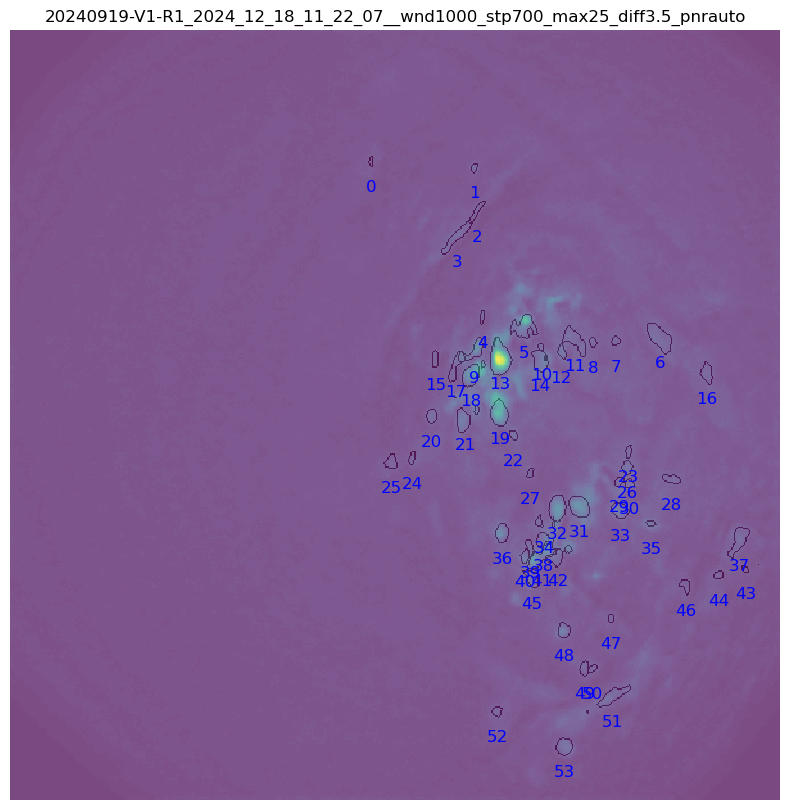


Processing session from DataFrame index 15: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_12_31/20240919v1l5r2mini_13_54
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_12_31/20240919v1l5r2mini_13_54/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20240919-V1-R2/customEntValHere/2024_12_31/13_55_41/My_V4_Miniscope/minian_dataset_wnd1500_stp700_max25_diff5.0_pnrauto.nc


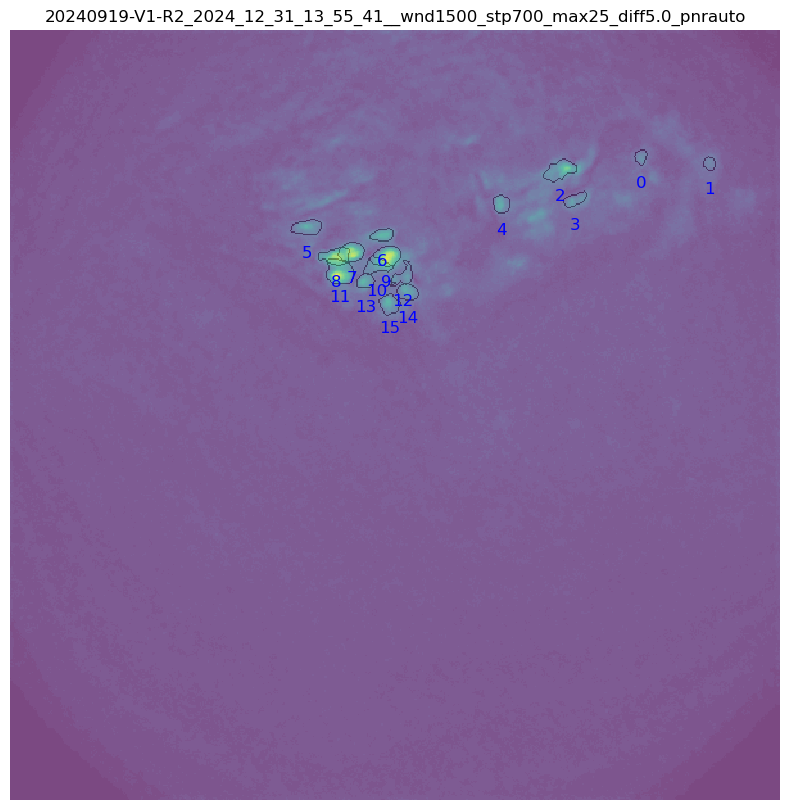


Processing session from DataFrame index 16: /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_12/20241001PMCRE2mini_13_44
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_12/20241001PMCRE2mini_13_44/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20241001PMCRE2/customEntValHere/2025_02_12/13_45_01/My_V4_Miniscope/minian_dataset_wnd1500_stp700_max15_diff4.0_pnrauto.nc


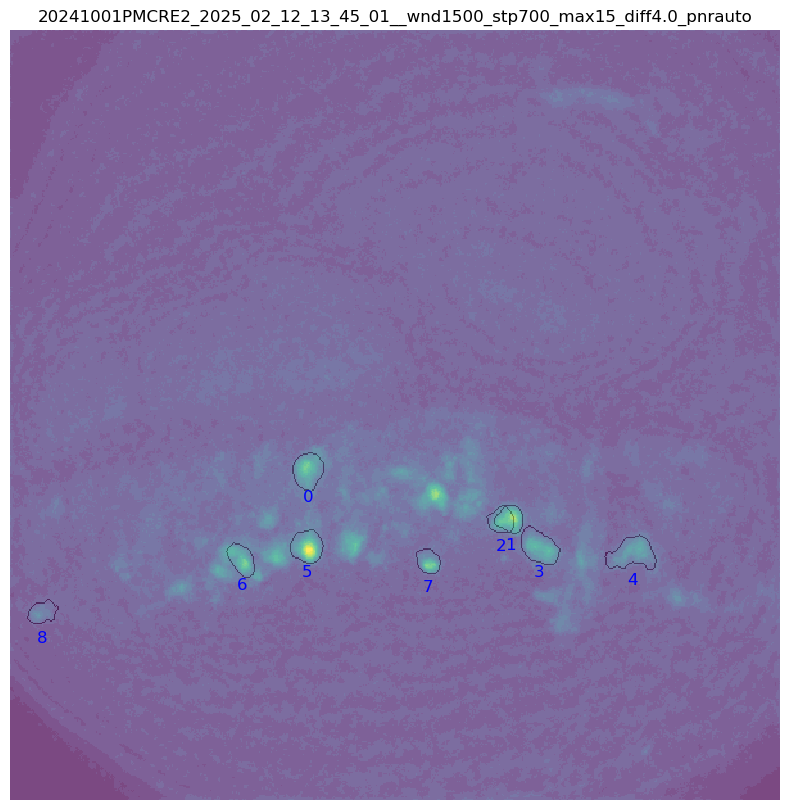


Processing session from DataFrame index 17: /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_12/20241001PMCRE2mini_13_57
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_12/20241001PMCRE2mini_13_57/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20241001PMCRE2/customEntValHere/2025_02_12/14_01_13/My_V4_Miniscope/minian_dataset_wnd1500_stp700_max15_diff4.0_pnrauto.nc


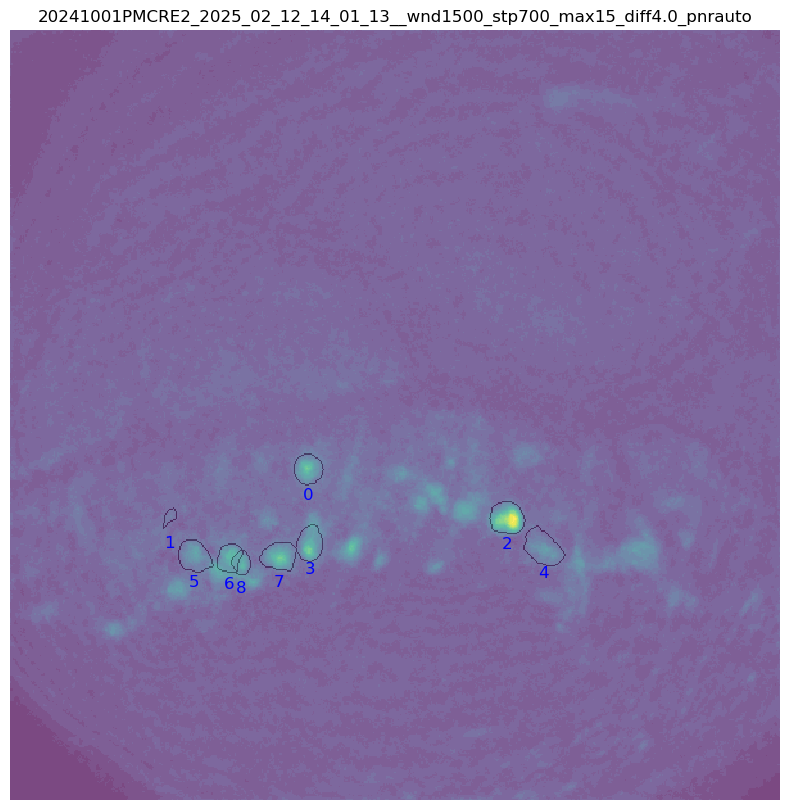


Processing session from DataFrame index 18: /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_12/20241001PMCRE2mini_15_35
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_12/20241001PMCRE2mini_15_35/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20241001PMCRE2/customEntValHere/2025_02_12/15_36_16/My_V4_Miniscope/minian_dataset_wnd1500_stp700_max15_diff4.0_pnrauto.nc


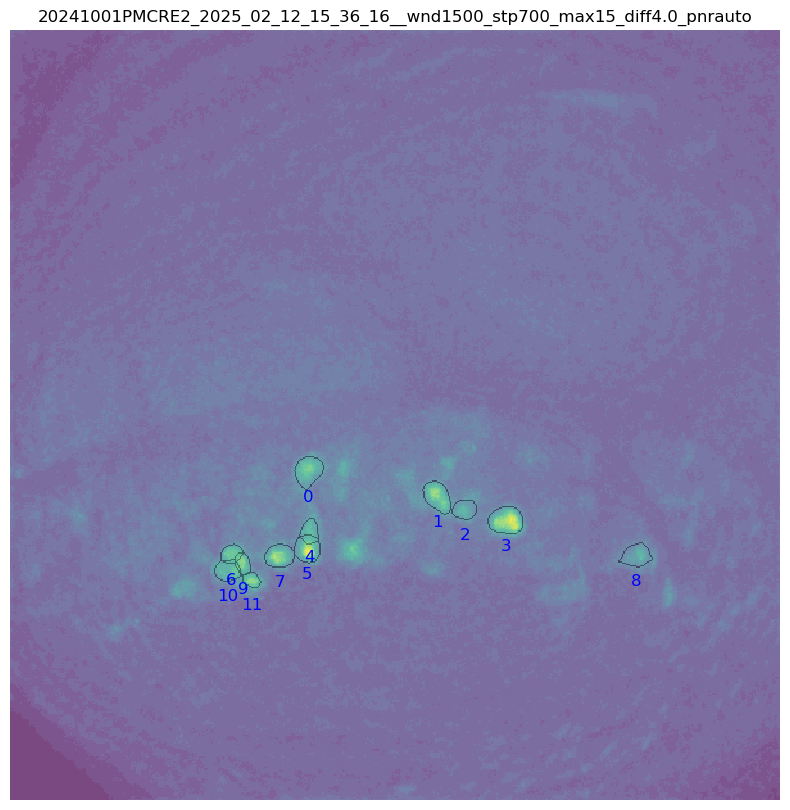


Processing session from DataFrame index 19: /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_13/20241225PMCLE1mini_11_06
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_13/20241225PMCLE1mini_11_06/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20241224PMCLE1/customEntValHere/2025_02_13/11_07_37/My_V4_Miniscope/minian_dataset.nc


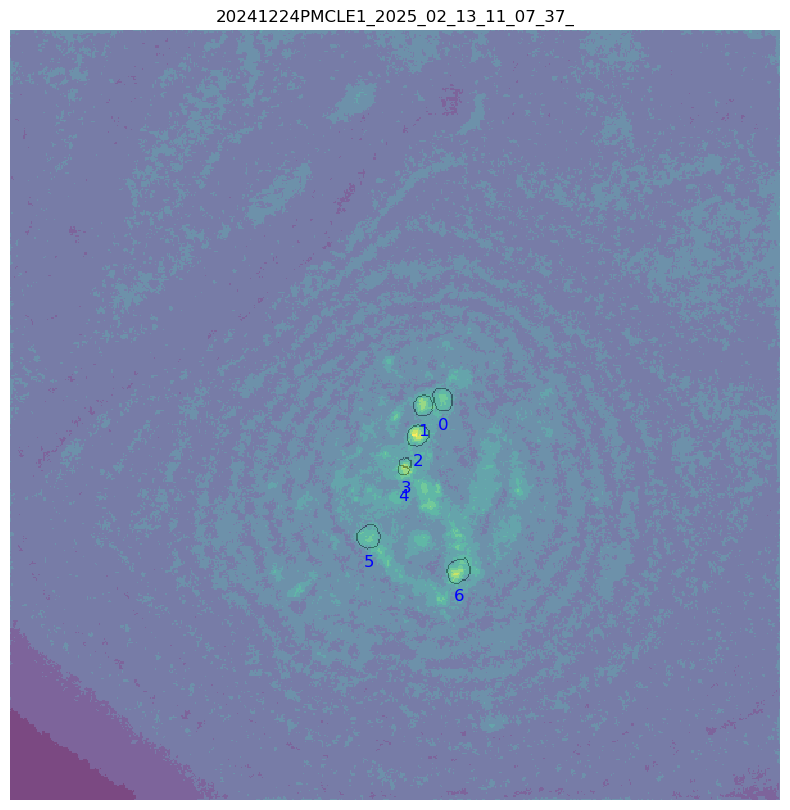


Processing session from DataFrame index 20: /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_27/20241015PMCBE1mini_12_24
Found mapping for candidate rec_path: /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_27/20241015PMCBE1mini_12_24/DANNCE/predict00/save_data_AVG.mat
Selected netCDF file: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20241015PMCBE1/customEntValHere/2025_02_27/12_25_53/My_V4_Miniscope/minian_dataset_stp_size_300.nc


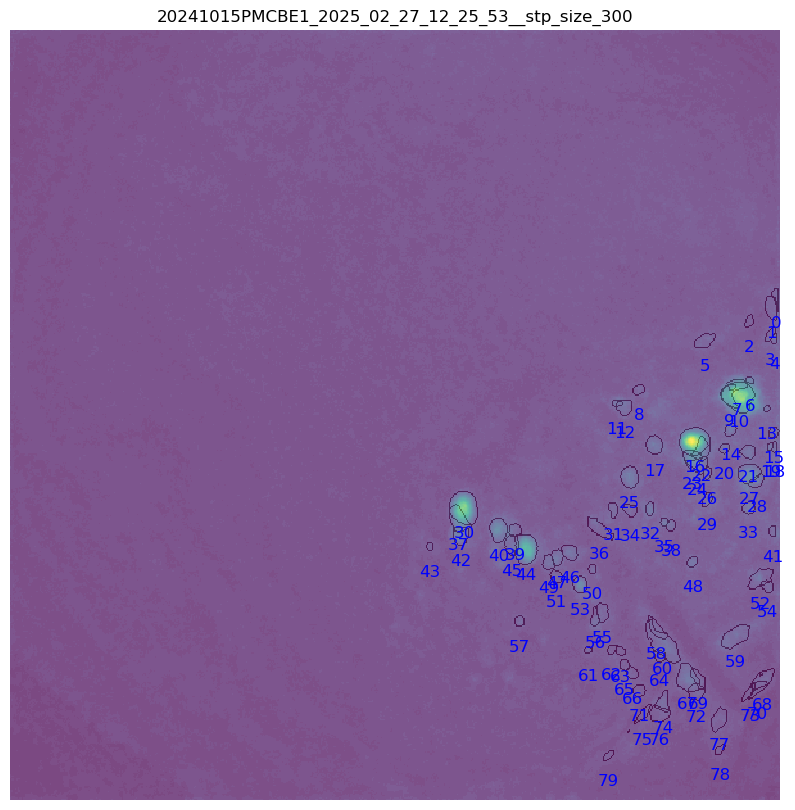

In [ ]:
#below is when, there is missing ones. actually better than above...
import os
import sys
sys.path.append(os.path.abspath('../..'))
from utlis.Ca_tools.mini_param_vis_utlis import vis_param_missing_from_df
import json
# It is assumed that these helper functions are defined elsewhere:
#   load_minian_data_specific(nc_filepath, timestamp_filepath)
#   overlay_all_roi_edges_no_show(data, max_proj)




vis_param_missing_from_df(df,mapping_json)

In [9]:
df['path']

0     /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_14/...
1     /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_14/...
2     /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_14/...
3     /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_14/...
4     /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_17/...
5     /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_17/...
6     /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_24/...
7     /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_25/...
8     /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/...
9     /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/...
10    /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/...
11    /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_06/...
12    /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_06/...
13    /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_07/...
14    /data/big_rim/rsync_dcc_sum/Oct3V1/2024_12_18/...
15    /data/big_rim/rsync_dcc_sum/Oct3V1/2024_12_31/...
16    /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_12/...
17    /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02

In [ ]:
#when saved into a wrong location, delete!!!

# import glob
# import os
# import shutil

# # Define the base directory where the mistaken folders are located.
# base_path = "/data/big_rim/rsync_dcc_sum/Oct3V1/"

# # This pattern will match any directory with the relative path DANNCE/predict00/MIR_Aligned anywhere under base_path.
# pattern = os.path.join(base_path, "**", "DANNCE", "predict00", "MIR_Aligned")

# # Use glob to recursively find all matching directories.
# wrong_folders = glob.glob(pattern, recursive=True)

# if not wrong_folders:
#     print("No folders matching the pattern were found.")
# else:
#     for folder in wrong_folders:
#         if os.path.isdir(folder):
#             shutil.rmtree(folder)
#             print(f"Removed folder and its contents: {folder}")


Removed folder and its contents: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_07/20241015pmcr2_AO_12_52/DANNCE/predict00/MIR_Aligned
Removed folder and its contents: /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_12/20241001PMCRE2mini_13_57/DANNCE/predict00/MIR_Aligned
Removed folder and its contents: /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_12/20241001PMCRE2mini_13_44/DANNCE/predict00/MIR_Aligned
Removed folder and its contents: /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_12/20241001PMCRE2mini_15_35/DANNCE/predict00/MIR_Aligned
Removed folder and its contents: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_25/20241002PMCr2_16_25/DANNCE/predict00/MIR_Aligned
Removed folder and its contents: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_12_18/20240919v1l5r1mini_11_21/DANNCE/predict00/MIR_Aligned
Removed folder and its contents: /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_27/20241015PMCBE1mini_12_24/DANNCE/predict00/MIR_Aligned
Removed folder and its contents: /data/big_rim/rsync_dcc_sum/Oct3V1/2025_02_

In [ ]:
# import sys
# import os
# sys.path.append(os.path.abspath('../..'))

# from utlis.scan_engine_utlis.scan_eng_big_utlis import log_experiment_data
# from status_field_config_mini_250220 import STATUS_FIELDS_CONFIG
# if __name__ == "__main__":
#     root_dir = "/data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted" #"/data/big_rim/mir_data/Oct3V1mini/Oct3V1mini_sorted"
#     failed_paths_file = None #'/data/big_rim/mir_data/Oct3V1mini/Oct3V1mini_sorted/sync_failed.txt'
#     manual_log_path = "/home/lq53/mir_repos/BBOP/random_tests/25mar_minibbop_integration/mini_sanity_240324_mannual.csv"
#     # 1) Delete all parquet files first
#     # remove_all_parquet_files(root_dir)

#     # 2) Then log only My_V4_Miniscope
#     force_reprocess = []
#     rescan_days = 0.001  # Lower for quick re-scan testing

#     log_experiment_data(root_dir, manual_log_path, failed_paths_file, STATUS_FIELDS_CONFIG,
#                         force_reprocess=force_reprocess,
#                         rescan_days=rescan_days)


Match found: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20241212v1l1r1/customEntValHere/2024_12_31/11_31_05/My_V4_Miniscope
Match found: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20240910-V1-R/customEntValHere/2024_11_01/12_52_48/My_V4_Miniscope
Match found: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20240910-V1-R/customEntValHere/2024_11_01/13_09_59/My_V4_Miniscope
Log for 20241212v1l1r1/customEntValHere/2024_12_31/11_31_05 saved at /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20241212v1l1r1/customEntValHere/2024_12_31/11_31_05/folder_log.parquet
Match found: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20240919-V1-R1/customEntValHere/2024_12_18/11_22_07/My_V4_Miniscope
Match found: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20240910-V1-R/customEntValHere/2024_11_01/11_39_00/My_V4_Miniscope
Match found: /data/big_rim/rsync_dcc_sum/Oct3V1mini_sorted/20240819-V1-r1/customEntValHere/2024_10_17/14_09_19/My_V4_Miniscope
Log for 20240919-V1-R1/customEntValHere/2024_12_31/14_2

In [4]:
# # sys.path.append(os.path.abspath('../..'))
# from utlis.scan_engine_utlis.scan_engine_utlis import read_all_parquet_files
# # base_folder = "/hpc/group/tdunn/Bryan_Rigs/BigOpenField/24summ"
# all_mini = read_all_parquet_files(root_dir)